In [12]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [13]:
with open("../Names.txt", 'r') as f:
    names = f.read().split('\n')

In [14]:
len(names)

55692

In [15]:
print(np.unique(list(''.join(names))))

[' ' '-' '.' 'A' 'B' 'C' 'D' 'E' 'F' 'G' 'H' 'I' 'J' 'K' 'L' 'M' 'N' 'O'
 'P' 'Q' 'R' 'S' 'T' 'U' 'V' 'W' 'X' 'Y' 'Z' 'a' 'b' 'c' 'd' 'e' 'f' 'g'
 'h' 'i' 'j' 'k' 'l' 'm' 'n' 'o' 'p' 'q' 'r' 's' 't' 'u' 'v' 'w' 'x' 'y'
 'z']


In [16]:
stopchars = [" ","-","."]

In [17]:
names = [name.lower() for name in names if not any(char in stopchars for char in name)]

In [18]:
chars = np.unique(['!']+list(''.join(names)))

In [19]:
char_index = dict()
for char in chars:
    char_index[char] = len(char_index)

In [20]:
window_length = 3
Xs,ys = [],[]
for name in names:
    window = [0]*window_length
    for c in name+'!':
        Xs.append(window)
        ys.append(char_index[c])
        window = window[1:]+[char_index[c]]

In [21]:
Xs = torch.tensor(Xs)
ys = torch.tensor(ys)

In [22]:
# The training data as window vs next word
for i in list(map(lambda x : str(x[0]) + ' => ' + str(x[1]),list(zip([[chars[x] for x in X] for X in Xs],[chars[y] for y in ys])))):
    print(i)

['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => a
['a', 'b', 'a'] => n
['b', 'a', 'n'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => r
['h', 'a', 'r'] => a
['a', 'r', 'a'] => n
['r', 'a', 'n'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => s
['h', 'a', 's'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => a
['b', 'h', 'a'] => t
['h', 'a', 't'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => e
['b', 'h', 'e'] => e
['h', 'e', 'e'] => r
['e', 'e', 'r'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => a
['!', 'a', 'a'] => b
['a', 'a', 'b'] => h
['a', 'b', 'h'] => e
['b', 'h', 'e'] => e
['h', 'e', 'e'] => r
['e', 'e', 'r'] => !
['!', '!', '!'] => a
['!', '!', 'a'] => b
['!', 'a', 'b

In [23]:
Xs.shape, Xs.dtype, ys.shape, ys.dtype

(torch.Size([494648, 3]), torch.int64, torch.Size([494648]), torch.int64)

In [24]:
# Creating an embedding space of dim 2 to embed each character
C = torch.randn((len(chars), 2), requires_grad=True)

In [25]:
C

tensor([[ 0.5064, -1.8627],
        [-0.0222, -1.4240],
        [-0.0445, -1.4504],
        [ 0.3206,  0.0346],
        [-0.4271,  0.7471],
        [-1.2240, -1.6484],
        [-1.0725,  0.3502],
        [ 1.5696, -1.0913],
        [-0.1708,  0.4808],
        [-1.1060, -0.0365],
        [ 1.6650, -0.8239],
        [ 0.8200,  0.7803],
        [-1.1900, -0.7831],
        [-1.0654, -1.7569],
        [ 0.1238,  0.3014],
        [ 1.2832, -0.5759],
        [-0.5045,  0.3295],
        [ 0.4807,  0.5591],
        [ 1.5282, -0.8649],
        [-0.0894,  2.4574],
        [ 0.5872,  0.1916],
        [-0.5396, -0.4592],
        [-1.5369, -0.5533],
        [-0.3790, -1.0096],
        [ 0.6065,  1.7717],
        [-1.7201, -1.9902],
        [-0.5350, -0.3614]], requires_grad=True)

In [26]:
emb=C[Xs]

In [27]:
W = torch.randn((6,100))
b = torch.randn((100))

In [28]:
h = torch.tanh(emb.reshape(-1,6) @ W + b)

In [29]:
h.shape

torch.Size([494648, 100])

In [30]:
W2 = torch.randn(100,len(chars))
b2 = torch.randn(len(chars))

In [31]:
h = torch.softmax(h @ W2 + b2, dim=1)

In [32]:
h.shape

torch.Size([494648, 27])

In [33]:
loss = -h[torch.arange(len(h)), ys].log().mean() #negative log likelihood loss

In [34]:
loss

tensor(16.6700, grad_fn=<NegBackward0>)

Neater code

In [35]:
C = torch.randn((len(chars), 2), requires_grad=True)
W1 = torch.randn((6,100))
b1 = torch.randn((100))
W2 = torch.randn(100,len(chars))
b2 = torch.randn(len(chars))
parameters = [W1,b1,W2,b2,C]

In [36]:
sum(p.nelement() for p in parameters)

3481

In [37]:
for p in parameters:
    p.requires_grad = True

In [38]:
lre = np.linspace(-3,0,1000)
lrs = 10**lre

In [39]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=0.1, random_state=42)
X_train,X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=42)

In [40]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= lrs[i] * p.grad
    losses.append(loss.item())
    exp_rates.append(lre[i])

In [41]:
loss.item()

6.11387825012207

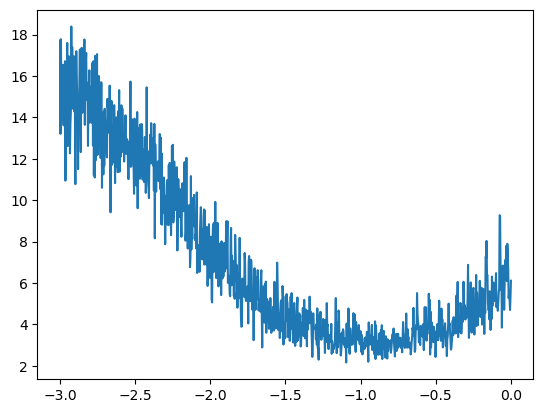

In [42]:
plt.plot(exp_rates,losses)

In [46]:
#10**-1 = 0.1 seems to be the right learning rate
batch_size=32
losses = []
for i in range(10000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.1 * p.grad
print(loss.item())

2.1942522525787354


In [47]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(Xs), (batch_size,))
    x_batch=Xs[batch]
    y_batch=ys[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), ys].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.01 * p.grad
print(loss.item())

1.8505147695541382


In [48]:
emb = C[X_train]
logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
train_loss = F.cross_entropy(logits, y_train)
emb = C[X_val]
logits = torch.tanh(emb.reshape(-1,6) @ W1 + b1) @ W2 + b2
val_loss = F.cross_entropy(logits, y_val)
print(f'Train loss: {train_loss.item()}, Val loss: {val_loss.item()}')

Train loss: 2.113175392150879, Val loss: 2.117419481277466


In [49]:
#Old model is underfitting, so we make a new model
C = torch.randn((len(chars), 5), requires_grad=True)
W1 = torch.randn((5*3,300))
b1 = torch.randn((300))
W2 = torch.randn(300,len(chars))
b2 = torch.randn(len(chars))
parameters = [W1,b1,W2,b2,C]

In [50]:
sum(p.nelement() for p in parameters)

13062

In [51]:
for p in parameters:
    p.requires_grad = True

In [52]:
lre = np.linspace(-3,0,1000)
lrs = 10**lre

In [53]:
batch_size=32
exp_rates = []
losses = []
for i in range(1000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= lrs[i] * p.grad
    losses.append(loss.item())
    exp_rates.append(lre[i])

In [54]:
loss.item()

15.424479484558105

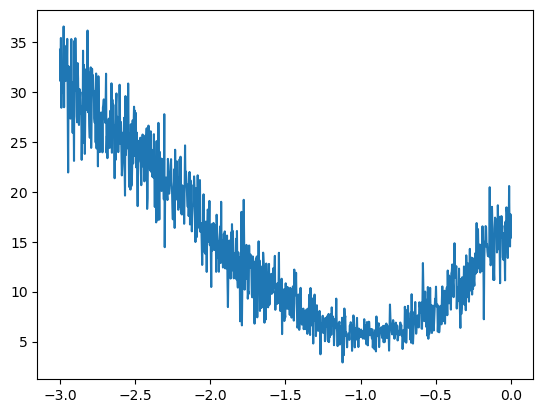

In [55]:
plt.plot(exp_rates,losses)

In [76]:
#10**-1 = 0.1 seems to be the right learning rate
batch_size=32
losses = []
for i in range(10000):
    #minibatch
    batch = torch.randint(0,len(X_train), (batch_size,))
    x_batch=X_train[batch]
    y_batch=y_train[batch]
    # forward pass
    emb = C[x_batch]
    logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
    # o = torch.softmax(logits,dim=1)
    # loss = -o[torch.arange(len(o)), y_batch].log().mean()
    loss = F.cross_entropy(logits, y_batch)
    # backward pass
    for p in parameters:
        p.grad = None
    loss.backward()
    # update parameters
    for p in parameters:
        p.data -= 0.01 * p.grad
print(loss.item())

1.5576257705688477


In [77]:
emb = C[X_train]
logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
train_loss = F.cross_entropy(logits, y_train)
emb = C[X_val]
logits = torch.tanh(emb.reshape(-1,15) @ W1 + b1) @ W2 + b2
val_loss = F.cross_entropy(logits, y_val)
print(f'Train loss: {train_loss.item()}, Val loss: {val_loss.item()}')

Train loss: 1.9505542516708374, Val loss: 1.9724299907684326


In [78]:
import pickle
torch.save(C, 'C.pt')
torch.save(W1, 'W1.pt')
torch.save(b1, 'b1.pt')
torch.save(W2, 'W2.pt')
torch.save(b2, 'b2.pt')
with open('chars.pkl', 'wb') as f:
    pickle.dump(chars, f)
with open('char_index.pkl', 'wb') as f:
    pickle.dump(char_index, f)